## Regresión logística multiclase

[Curso de Regresión Logística con Python y scikit-learn](platzi.com/reglog)

## Importar librerías

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay
sns.set()

## Carga de datos

In [2]:
df = pd.read_csv("/content/Dry_Bean.csv")


In [3]:
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [4]:
df["Class"].unique()

array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

In [5]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860154,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


## Drop duplicates

In [6]:
# Se eliminan los datos duplicados.
df.drop_duplicates(inplace = True)

## Manejo de datos nulos

In [7]:
# Se verifica la cantidad de datos nulos en el Df.
df.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

## undersampling

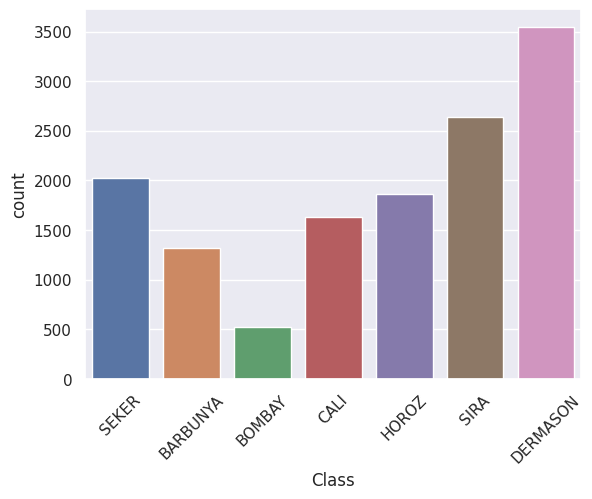

In [8]:
# Utilizamos Seaborn para crear un gráfico de conteo de las clases en la columna "Class".
sns.countplot(data=df, x="Class")

# Rotamos las etiquetas en el eje x para mejorar la legibilidad.
plt.xticks(rotation=45)

# Mostramos el gráfico.
plt.show()


In [9]:
# Importamos la función RandomUnderSampler de la biblioteca imbalanced-learn.
from imblearn.under_sampling import RandomUnderSampler
# Creamos una instancia de RandomUnderSampler para el submuestreo de datos desequilibrados.
undersampler = RandomUnderSampler()

In [10]:
# Dividimos nuestros datos en características (X) y la variable objetivo (y).
X = df.drop("Class", axis = 1)
y = df.Class

In [41]:
# Aplicamos el submuestreo a nuestros datos para equilibrar las clases.
X_under, y_under = undersampler.fit_resample(X, y)

<Axes: >

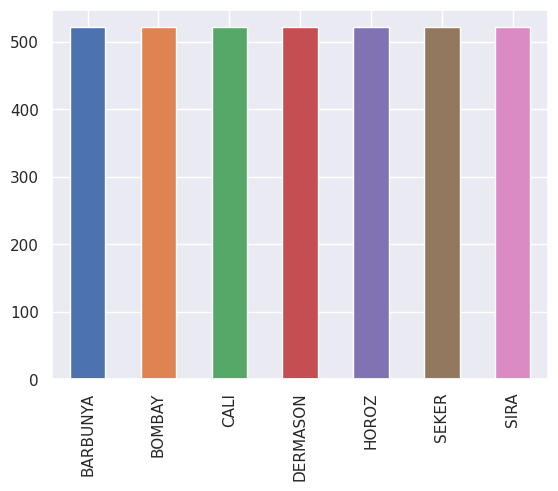

In [42]:
# Creamos un gráfico de barras que muestra la distribución de las clases después del submuestreo.
y_under.value_counts().plot.bar( color = sns.color_palette())

In [44]:
# Dimensión de Df original.
df.shape

(13543, 17)

In [45]:
# Dimensión con Df con datos equilibrados.
X_under.shape

(3654, 16)

## Conversión a numéricos

In [46]:
list(y_under.unique())

['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA']

In [47]:
# Conversión de datos categoricos a datos númericos.
y_under.replace(['BARBUNYA', 'BOMBAY', 'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA'], [1, 2, 3, 4, 5, 6, 7], inplace = True)

In [48]:
list(y_under.unique())

[1, 2, 3, 4, 5, 6, 7]

## Análisis exploratorio de datos

### Corrrelations

In [49]:
# Copiamos los datos de X_under e y_under para realizar un análisis exploratorio de datos (EDA).
X_eda = X_under.copy()
y_eda = y_under.copy()

In [50]:
# Creamos un DataFrame df_EDA que contiene las características y la columna "Class" de las etiquetas.
df_EDA = X_eda
df_EDA["Class"] = y_eda

In [51]:
# Mostramos las primeras filas del DataFrame df_EDA.
df_EDA.head()


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,76098,1073.575,385.825011,251.653477,1.533160,0.758006,77155,311.273164,0.714052,0.986300,0.829695,0.806773,0.005070,0.001325,0.650883,0.997907,1
1,68269,1055.883,344.253402,254.077012,1.354918,0.674744,69922,294.826713,0.748826,0.976359,0.769488,0.856424,0.005043,0.001673,0.733461,0.993780,1
2,68056,1054.621,359.731355,242.202544,1.485250,0.739381,69299,294.366422,0.716801,0.982063,0.768924,0.818295,0.005286,0.001462,0.669607,0.994534,1
3,62499,1002.996,353.682843,225.352307,1.569466,0.770732,63749,282.092535,0.723745,0.980392,0.780701,0.797586,0.005659,0.001413,0.636144,0.998406,1
4,97060,1246.469,407.924022,303.898305,1.342304,0.667078,98830,351.540368,0.759944,0.982090,0.785032,0.861779,0.004203,0.001430,0.742663,0.996880,1


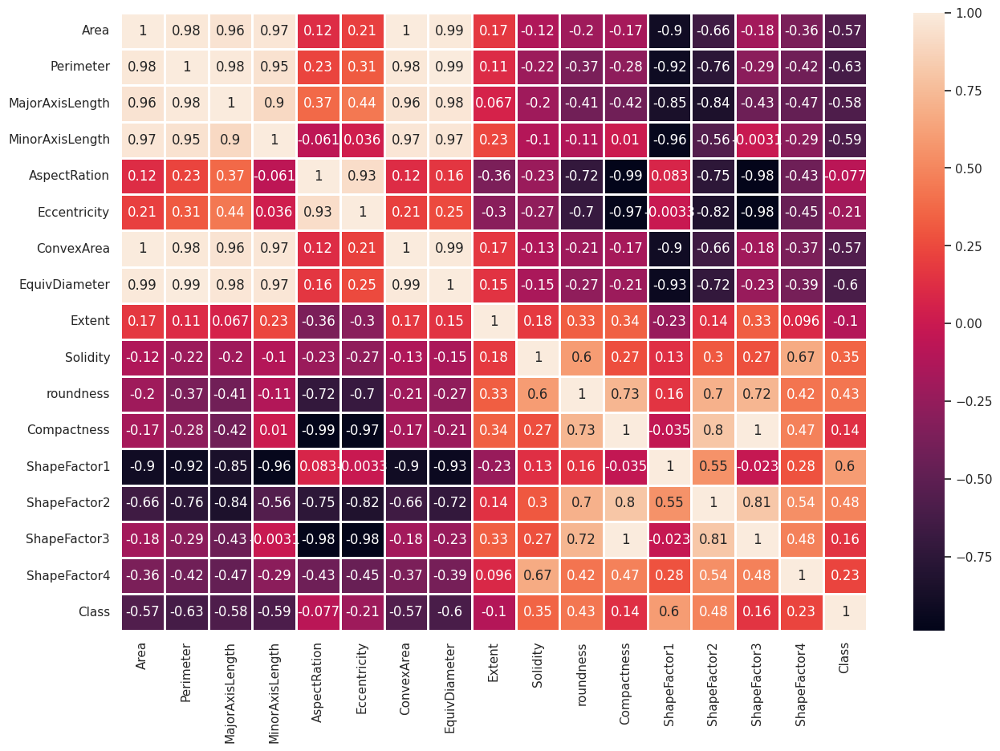

In [22]:
# Creamos un gráfico de mapa de calor para visualizar la correlación entre las características.
plt.figure(figsize=(15, 10))
sns.heatmap(df_EDA.corr(), annot=True, linewidths=0.8)
plt.show()

## Visualización de datos

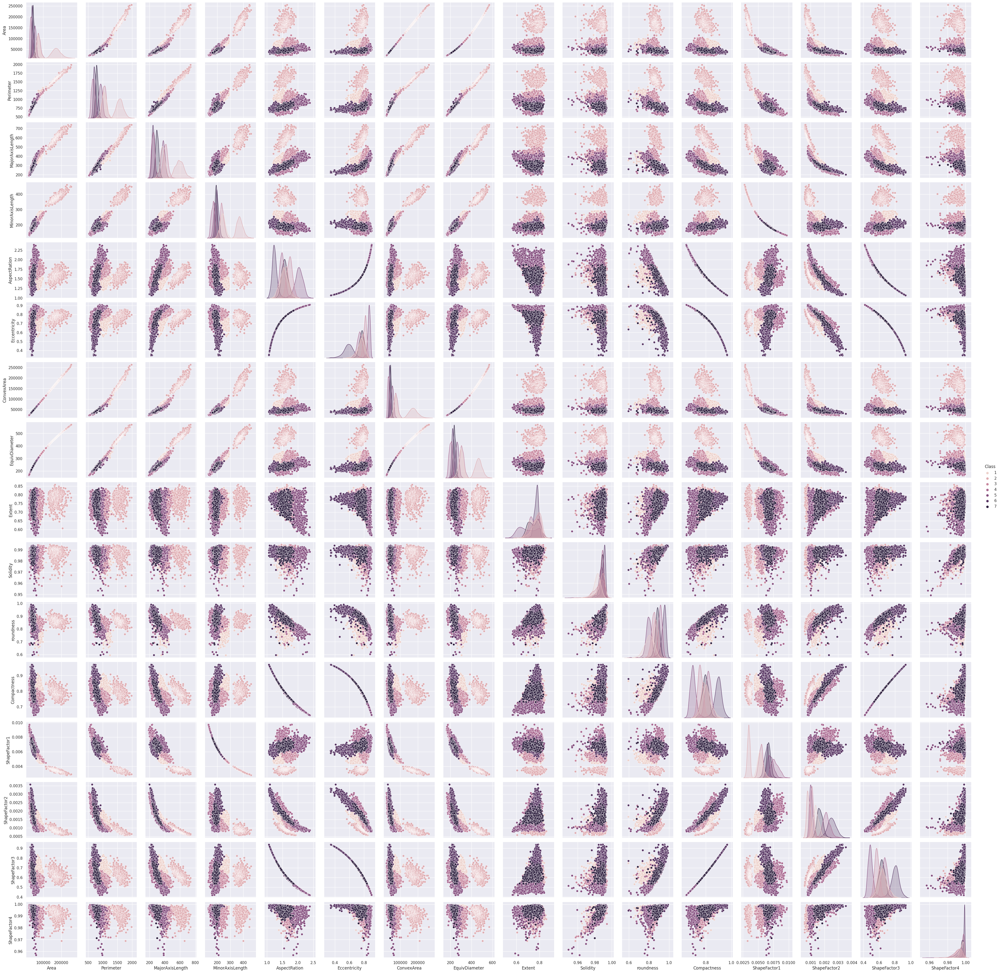

In [23]:
# Creamos un gráfico de pares (pair plot) para explorar las relaciones entre las características, diferenciando por clase.
sns.pairplot(data=df_EDA, hue="Class")

## Split y escalamiento de datos

In [52]:
# Eliminamos las columnas "ConvexArea" y "EquivDiameter" del conjunto de datos X_under.
X_under.drop(["ConvexArea", "EquivDiameter"], axis = 1, inplace = True)

In [53]:
# Dividimos los datos en conjuntos de entrenamiento y prueba utilizando train_test_split.
# También aplicamos una estandarización de características.
X_train, X_test, y_train, y_test = train_test_split(X_under, y_under, shuffle = True, random_state = 42, test_size = 0.2)

In [54]:
# Creamos una instancia de StandardScaler para estandarizar las características.
st_x = StandardScaler()

# Aplicamos la estandarización a las características de entrenamiento.
X_train = st_x.fit_transform(X_train)

# Aplicamos la misma transformación de estandarización a las características de prueba.
X_test = st_x.transform(X_test)

## Modelo multiclase

In [55]:
# Esta función crea y devuelve un modelo de regresión logística con opciones personalizables.

def logistic_model(C_, solver_, multi_class_):
    """
    Crea un modelo de regresión logística con opciones personalizadas.

    Args:
    - C_: Parámetro de regularización (inverso de la fuerza de regularización).
    - solver_: Algoritmo de optimización a utilizar.
    - multi_class_: Especifica cómo se manejan las clases múltiples (binario o multinomial).

    Returns:
    - logistic_regression_model: El modelo de regresión logística configurado según las opciones proporcionadas.
    """
    logistic_regression_model = LogisticRegression(random_state=42, solver=solver_, multi_class=multi_class_, n_jobs=-1, C=C_)
    return logistic_regression_model



In [56]:
# Creamos un modelo de regresión logística personalizado con parámetros específicos.
model = logistic_model(C_=1, solver_="saga", multi_class_="multinomial")

# Entrenamos el modelo utilizando los datos de entrenamiento.
model.fit(X_train, y_train)

# Realizamos predicciones utilizando el modelo entrenado en el conjunto de prueba.
prediction = model.predict(X_test)

# Imprimimos la matriz de confusión para evaluar el rendimiento del modelo.
print(confusion_matrix(y_test, prediction))

# Imprimimos la precisión (accuracy) del modelo en el conjunto de prueba.
print(accuracy_score(y_test, prediction))


[[117   0   7   0   1   0   3]
 [  0  98   0   0   0   0   0]
 [  3   0  98   0   2   0   0]
 [  0   0   0  94   1   1   9]
 [  0   0   1   0  92   0   3]
 [  0   0   0   2   0  88   1]
 [  0   0   1  13   1   0  95]]
0.93296853625171


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


In [57]:
# Definimos una lista de opciones para multiclass (uno contra todos y multinomial) y solucionadores.
multiclass = ["ovr", "multinomial"]
solver_list = ["sag", "saga", "liblinear", "newton-cg", "lbfgs"]

# Creamos listas para almacenar puntajes de precisión y parámetros utilizados.
scores = []
params = []

# Iteramos a través de las opciones de multiclass y solucionadores.
for i in multiclass:
    for j in solver_list:
        try:
            # Creamos un modelo de regresión logística con las opciones actuales.
            model = logistic_model(C_=1, solver_=j, multi_class_=i)

            # Entrenamos el modelo con los datos de entrenamiento.
            model.fit(X_train, y_train)

            # Realizamos predicciones en el conjunto de prueba.
            prediction = model.predict(X_test)

            # Almacenamos los parámetros utilizados en la lista de parámetros.
            params.append(i + "-" + j)

            # Calculamos y almacenamos la precisión (accuracy) en la lista de puntajes.
            accuracy = accuracy_score(y_test, prediction)
            scores.append(accuracy)
        except:
            None



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which 

## Evaluación de resultados

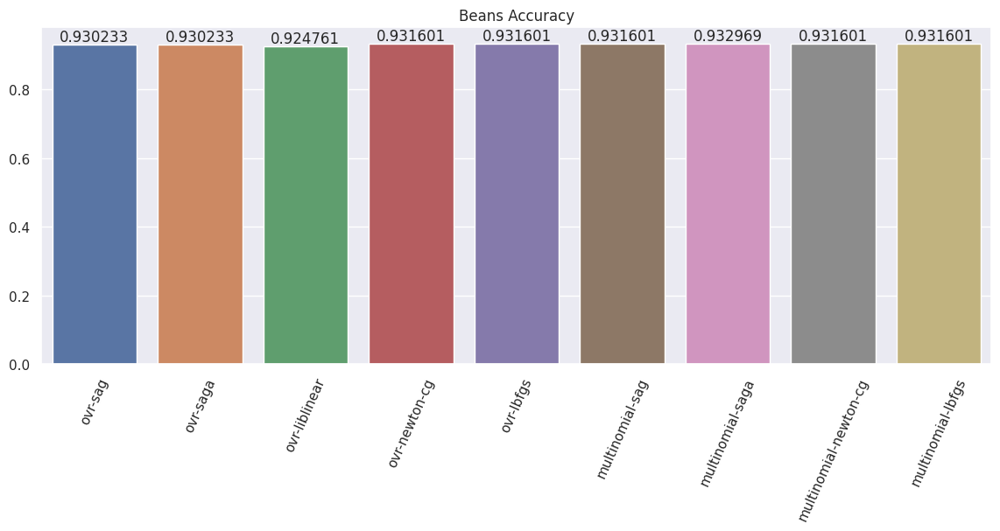

In [58]:
# Creamos una figura y un eje para visualizar el gráfico de barras.
fig, ax1 = plt.subplots(figsize=(14, 5))

# Creamos un gráfico de barras utilizando Seaborn.
ax = sns.barplot(
    ax=ax1,
    x=params,
    y=scores
)

# Configuramos el título del gráfico.
ax.set_title('Beans Accuracy')

# Rotamos las etiquetas en el eje x para que sean legibles.
ax.set_xticklabels(labels=ax.get_xticklabels(), rotation=66)

# Agregamos etiquetas en las barras con los valores de precisión.
ax.bar_label(ax.containers[0])

# Mostramos el gráfico.
plt.show()


In [65]:
# Creamos un modelo de regresión logística personalizado con parámetros específicos.
model = logistic_model(C_=1, solver_="newton-cg", multi_class_="multinomial")

# Entrenamos el modelo utilizando los datos de entrenamiento.
model.fit(X_train, y_train)

# Realizamos predicciones en el conjunto de prueba.
prediction = model.predict(X_test)

# Imprimimos la matriz de confusión para evaluar el rendimiento del modelo.
print("Confusion matrix:\n", confusion_matrix(y_test, prediction))

# Imprimimos la precisión (accuracy) del modelo en el conjunto de prueba.
print("Accuracy score:\n", accuracy_score(y_test, prediction))


Confunsion matrix:
 [[117   0   7   0   1   0   3]
 [  0  98   0   0   0   0   0]
 [  3   0  97   0   3   0   0]
 [  0   0   0  94   1   1   9]
 [  0   0   1   0  92   0   3]
 [  0   0   0   2   0  88   1]
 [  0   0   1  13   1   0  95]]
Accuracy score:
 0.9316005471956225


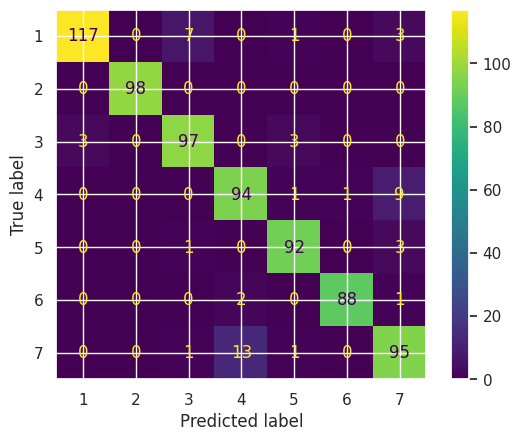

In [64]:
# Calculamos la matriz de confusión específica para las clases del modelo.
cm = confusion_matrix(y_test, prediction, labels=model.classes_)

# Creamos un objeto ConfusionMatrixDisplay para visualizar la matriz de confusión.
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)

# Generamos la representación gráfica de la matriz de confusión.
disp.plot()


In [66]:
import pkg_resources
installed_packages = pkg_resources.working_set
installed_packages_list = sorted(["{}=={}".format(i.key, i.version) for i in installed_packages])
installed_packages_list


['absl-py==1.4.0',
 'aiohttp==3.8.5',
 'aiosignal==1.3.1',
 'alabaster==0.7.13',
 'albumentations==1.3.1',
 'altair==4.2.2',
 'annotated-types==0.5.0',
 'anyio==3.7.1',
 'appdirs==1.4.4',
 'argon2-cffi-bindings==21.2.0',
 'argon2-cffi==23.1.0',
 'array-record==0.4.1',
 'arviz==0.15.1',
 'astropy==5.3.2',
 'astunparse==1.6.3',
 'async-timeout==4.0.3',
 'attrs==23.1.0',
 'audioread==3.0.0',
 'autograd==1.6.2',
 'babel==2.12.1',
 'backcall==0.2.0',
 'beautifulsoup4==4.11.2',
 'bleach==6.0.0',
 'blinker==1.4',
 'blis==0.7.10',
 'blosc2==2.0.0',
 'bokeh==3.2.2',
 'bqplot==0.12.40',
 'branca==0.6.0',
 'build==1.0.0',
 'cachecontrol==0.13.1',
 'cachetools==5.3.1',
 'catalogue==2.0.9',
 'certifi==2023.7.22',
 'cffi==1.15.1',
 'chardet==5.2.0',
 'charset-normalizer==3.2.0',
 'chex==0.1.7',
 'click-plugins==1.1.1',
 'click==8.1.7',
 'cligj==0.7.2',
 'cloudpickle==2.2.1',
 'cmake==3.27.2',
 'cmdstanpy==1.1.0',
 'colorcet==3.0.1',
 'colorlover==0.3.0',
 'colour==0.1.5',
 'community==1.0.0b1',
 'co